# Dataset D profiling
Dataset columns are printed with their standardized distribution. Pandas-profiling (https://github.com/pandas-profiling/pandas-profiling) is used to display relevant metrics.

In [1]:
import numpy as np
import pandas as pd
import pandas_profiling
import src.core_stateless as statelessApi
from src.core import valueDistribution
from src.core_configs import getConfigD

Using TensorFlow backend.


In [2]:
filename, columns, irrelevantColumns, targetColumns, traintime, testtime, columnOrder = getConfigD("30min")

relevantColumns, columnDescriptions, columnUnits, columnNames, df = statelessApi.initDataframe(
    filename,
    columns,
    irrelevantColumns,
)

Columns before removal: 
Col. 0 : 20TT001 - Process Inlet Temperature
Col. 1 : 20PT001 - Process Inlet Pressure
Col. 2 : 20FT001 - Process Flow Rate
Col. 3 : 20TT002 - Process Outlet Temperature
Col. 4 : 20PDT001 - Process Pressure Difference
Col. 5 : 50TT001 - Coolant Inlet Temperature
Col. 6 : 50PT001 - Coolant Inlet Pressure
Col. 7 : 50FT001 - Coolant Flow Rate
Col. 8 : 50TT002 - Coolant Outlet Temperature
Col. 9 : 50PDT001 - Coolant Pressure Difference
Col. 10 : 50TV001 - Coolant Valve Opening

Columns after removal: 
Col. 0 : 20TT001 - Process Inlet Temperature
Col. 1 : 20PT001 - Process Inlet Pressure
Col. 2 : 20FT001 - Process Flow Rate
Col. 3 : 20TT002 - Process Outlet Temperature
Col. 4 : 20PDT001 - Process Pressure Difference
Col. 5 : 50TT001 - Coolant Inlet Temperature
Col. 6 : 50PT001 - Coolant Inlet Pressure
Col. 7 : 50FT001 - Coolant Flow Rate
Col. 8 : 50TT002 - Coolant Outlet Temperature
Col. 9 : 50PDT001 - Coolant Pressure Difference
Col. 10 : 50TV001 - Coolant Valve Op

# Value Distribution
On the left, plots of the standardized sample points for each column can be seen. On the right, a distribution of the standardized values is shown. Training points are plotted in dark blue, while testing points are light blue. Vertical lines enclose the training period, with black indicating the beginning and blue indicating the end of the training period.

Notice that some columns are constant, while others vary in small ranges. Many columns are very correlated. This is considered to be very unlike what would be experienced in practice. Even though there is correlation between features even in a real processing plant, the correlation is not as strong as indicated by this simulated dataset.

Training samples and testing samples generally seem to have the same distribution. The only exception is coolant inlet temperature, for which the training period happens during winter with cold sea water temperatures and testing happens during spring with increasing temperatures.

Finding data between 2020-01-01 00:00:00 and 2020-03-20 00:00:00
Found 315 rows

Finding data between 2020-01-01 00:00:00 and 2020-08-01 00:00:00
Found 726 rows



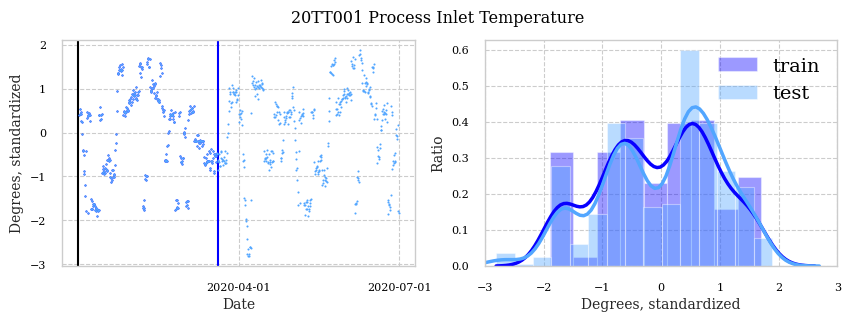

c:\users\herma\apps\master-thesis\venv\lib\site-packages\seaborn\distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
c:\users\herma\apps\master-thesis\venv\lib\site-packages\seaborn\distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


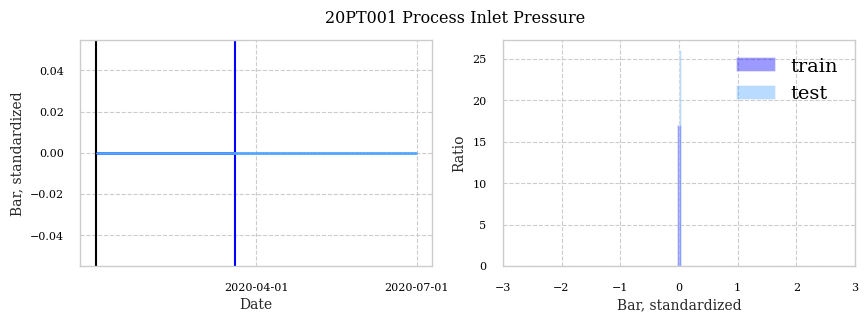

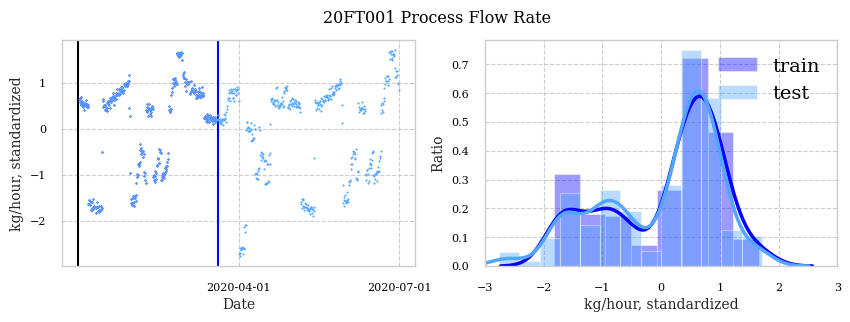

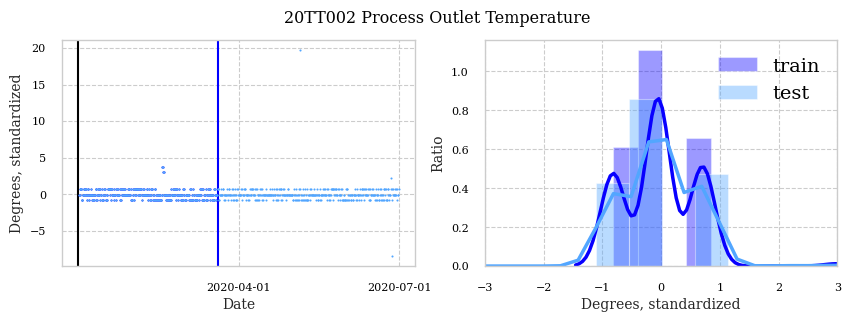

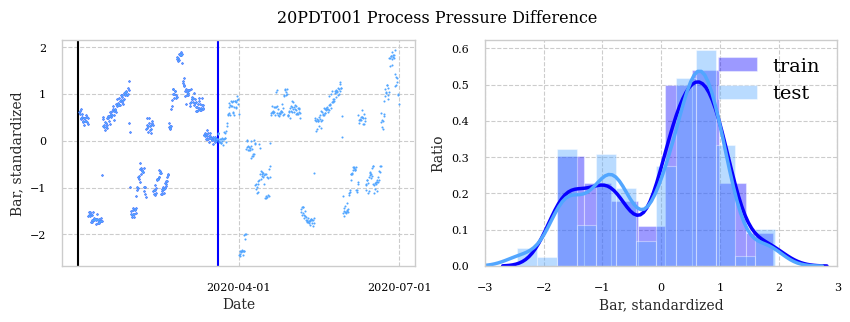

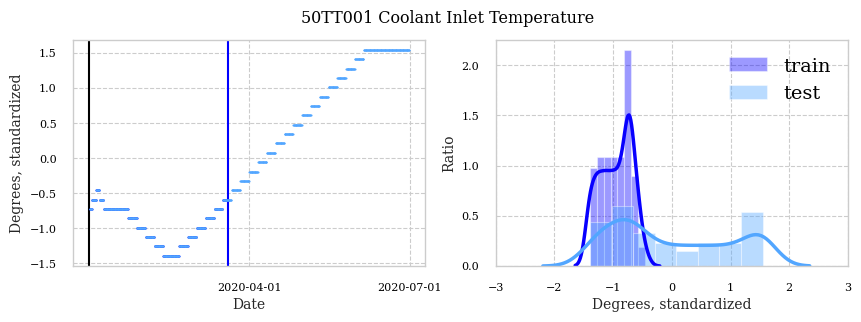

c:\users\herma\apps\master-thesis\venv\lib\site-packages\seaborn\distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
c:\users\herma\apps\master-thesis\venv\lib\site-packages\seaborn\distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


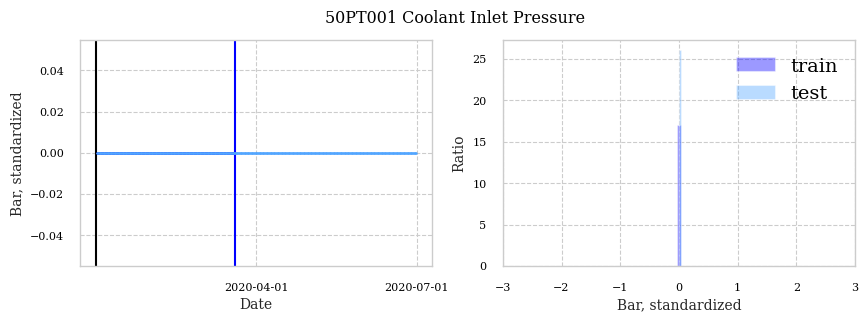

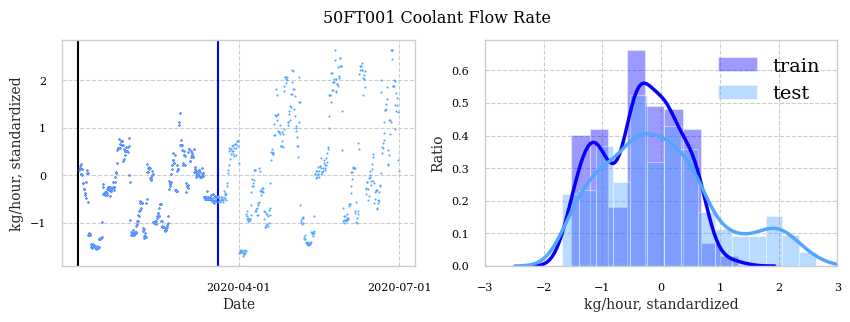

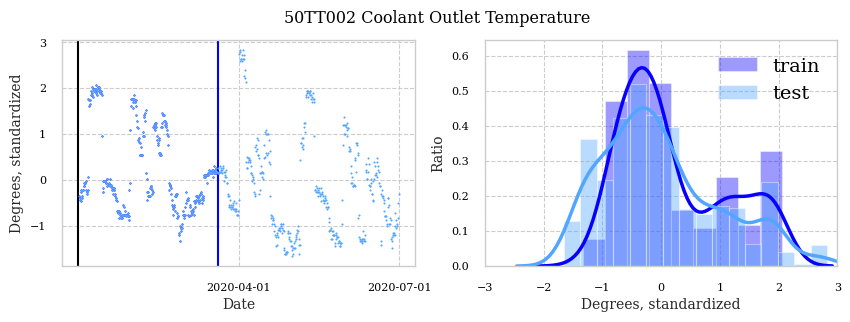

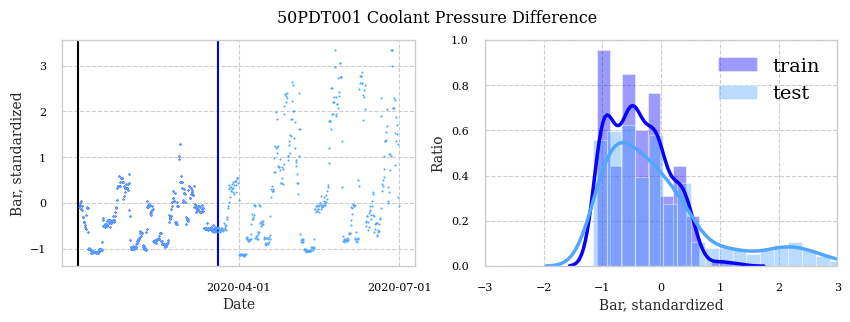

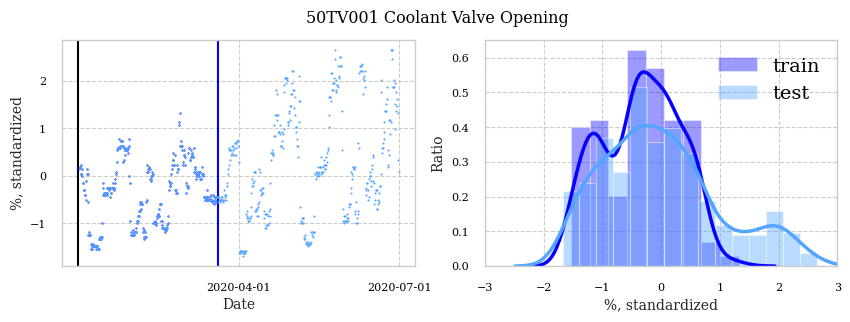

In [3]:
valueDistribution(df, traintime, testtime, columnDescriptions, columnUnits)

# Profiling
Pandas profiling offers detailed information about the provided dataset. Metrics such as missing cells, memory size, column uniqueness and column correlation can be seen.

Notice that almost all the dataset columns are flagged as either lacking unique values or being highly correlated with another column.

NB: not visible from GitHub, see https://htmlpreview.github.io/?https://github.com/hermanwh/master-thesis/blob/master/profiling/dataset_profiling_D.html

In [4]:
report = df.profile_report(sort='None', html={'style':{'full_width': True}}, progress_bar=False)
report.to_file(output_file="profiling/dataset_profiling_D.html")
report

In short, the profiling tool tells us that:
- There are no missing cells or duplicate rows in the dataset, indicating it can be used for machine learning algorithms
- The Process Inlet Pressure is constant, meaning there is zero variance
- The Process Flow Rate, Process Pressure Difference and Coolant Outlet Temperature are highly correlated
- The Coolant Inlet Pressure is constant, meaning there is zero variance
- The Coolant Flow Rate, Coolant Outlet Temperature, Coolant Pressure Difference and Coolant Valve Opening are highly correlated. 
